# Clustering Conformations using Python Libraries


In [3]:
import numpy as np
import pickle
from scipy.cluster.hierarchy import dendrogram, linkage, leaves_list, to_tree, centroid, cut_tree,fcluster
from matplotlib import pyplot as plt
from helper import compute_kmeans, convert_classes_to_clusters, real_cluster_map, plot_cluster_map,  misclassification, statistics, heat_map, plot_pca, plot_tsne, plot_kpca, info
import pandas as pd
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)
from sklearn.cluster import AgglomerativeClustering

### Testing Accuracy
Passing in already grouped and sorted arrays of the clusters and arrays of the groups derived from annotations, I've implemented two methods to test the accuracy.
The first one is faster using sampling to see which cluster matches which group while the second one attempts to fit all of the permutations of groups to clusters.

#### Note:


## Load presorted classification based on annotations list

In [4]:
#@ open files
with open("chains_list.var","rb") as chains_list_var:
   chains_list = pickle.load(chains_list_var)
   chains_list_var.close()
#print(f"chains_list: {chains_list}")
with open("structures/opened_active.var", "rb") as open_active_var:
    open_active_list = pickle.load(open_active_var)
    open_active_var.close()
with open("structures/closed_inactive.var", "rb") as closed_inactive_var:
    closed_inactive_list = pickle.load(closed_inactive_var)
    closed_inactive_var.close()
with open("structures/opened_inactive.var", "rb") as open_inactive_var:
    open_inactive_list = pickle.load(open_inactive_var)
    open_inactive_var.close()

print(f"open_active: {len(open_active_list)}")
print(f"closed_inactive: {len(closed_inactive_list)}")
print(f"open_inactive: {len(open_inactive_list)}")
annotated_dict_list_codes= {"open_active": open_active_list, "closed_inactive": closed_inactive_list, "open_inactive": open_inactive_list} #dictionary of codes list
annotated_dict_list ={"open_active": list(), "closed_inactive": list(), "open_inactive": list()} #dictionary of list of indices
for i,conformation in enumerate(chains_list):
    for j,l in enumerate(annotated_dict_list_codes):
        if conformation in annotated_dict_list_codes[l]:
            #print(f"l: {l}")
            annotated_dict_list[l].append(i)
#print(f"annotated_dict_list: {annotated_dict_list_codes}")


open_active: 162
closed_inactive: 277
open_inactive: 92


### Open calculated rms matrix and chains list
#### matrix.var
Calculated rms matrix from aligning all of the choice conformation chosen by best_align.py and calculated by pml_script_all.py.
#### chains_list.var
Generated by reading through the dictionary of annotated conformations and making a list of chains of the conformation. This will give the labeling order of the rms matrix obtained since pml_script_all.py iterated through this list

In [5]:
with open("matrix.var", "rb") as matrix_var:
   matrix = (pickle.load(matrix_var))
   matrix_var.close()
#print(f"matrix: {matrix}")
with open("matrix_AB.var", "rb") as matrix_AB_var:
   matrix_AB = (pickle.load(matrix_AB_var))
   matrix_AB_var.close()
with open("matrix_seg.var", "rb") as matrix_seg_var:
   matrix_seg = pickle.load(matrix_seg_var)
   matrix_seg_var.close()

## PCA reduction to 2 dimensions of the RMSD matrix CA

shape reduced matrix: (531, 2)
axes[0][0]: 135.76020667301634 matrix.T: [[135.76020667  70.5133525   70.94308717 ... -26.26900724 149.23928136
  149.42811057]
 [ 31.05728639 -58.3650935  -58.21254237 ... -22.97875411  36.4308554
   36.64528995]]


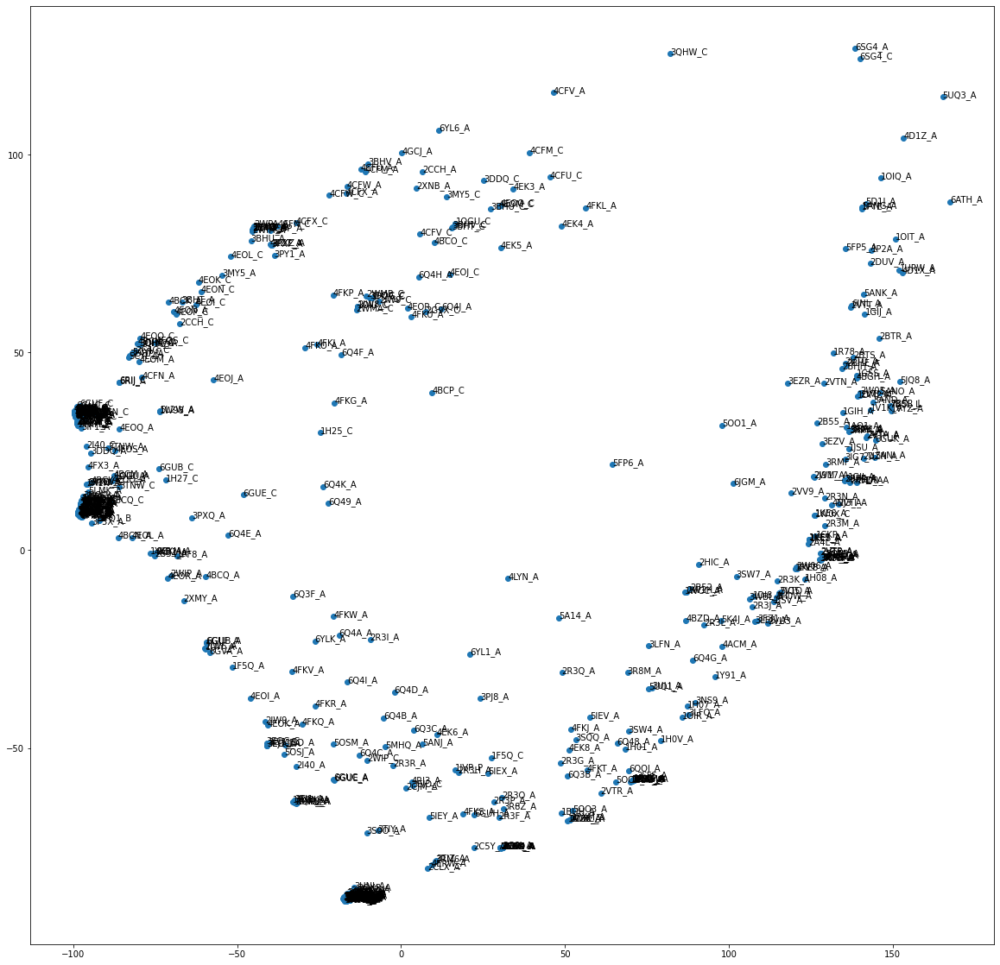

In [ ]:
reduced_mat= plot_pca(matrix,chains_list)

## Real Cluster map of CA RSMD Matrix:
Below is a plot where the real clusters are 

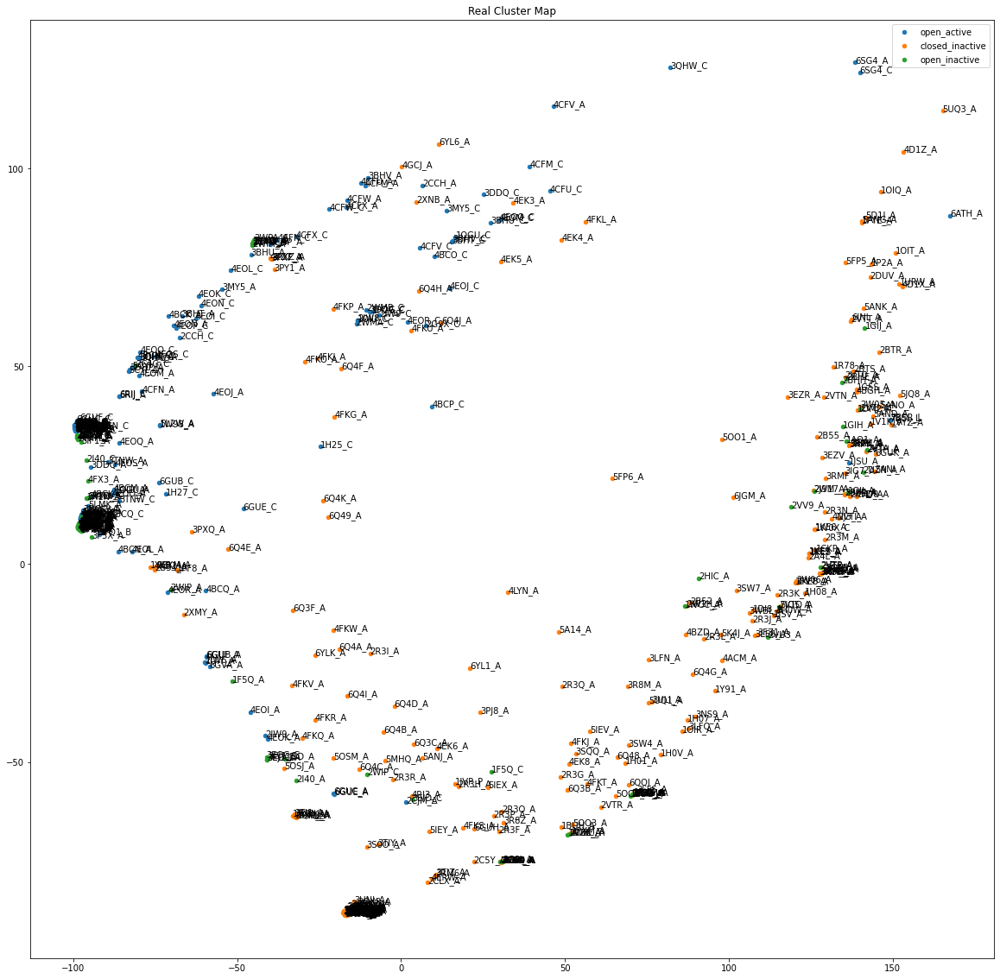

In [ ]:
real_cluster_map(reduced_mat,annotated_dict_list,chains_list)

## Using K-means on our reduced matrix:

------------------------------------------------------------
STATISTICS
------------------------------------------------------------
cluster 0, length: 132
cluster 1, length: 169
cluster 2, length: 230
------------------------------------------------------------
MACRO AVERAGES
------------------------------------------------------------
                 Precision    Recall  F1 score
open_inactive     0.121212  0.173913  0.142857
closed_inactive   0.863905  0.527076  0.654709
open_active       0.621739  0.882716  0.729592
Averages          0.535619  0.527902  0.509052
out:
                            Real open_inactive  Real closed_inactive  Real open_active
Predicted open_inactive                    16                   103                13
Predicted closed_inactive                  17                   146                 6
Predicted open_active                      59                    28               143
------------------------------------------------------------
MICRO AVERAGES


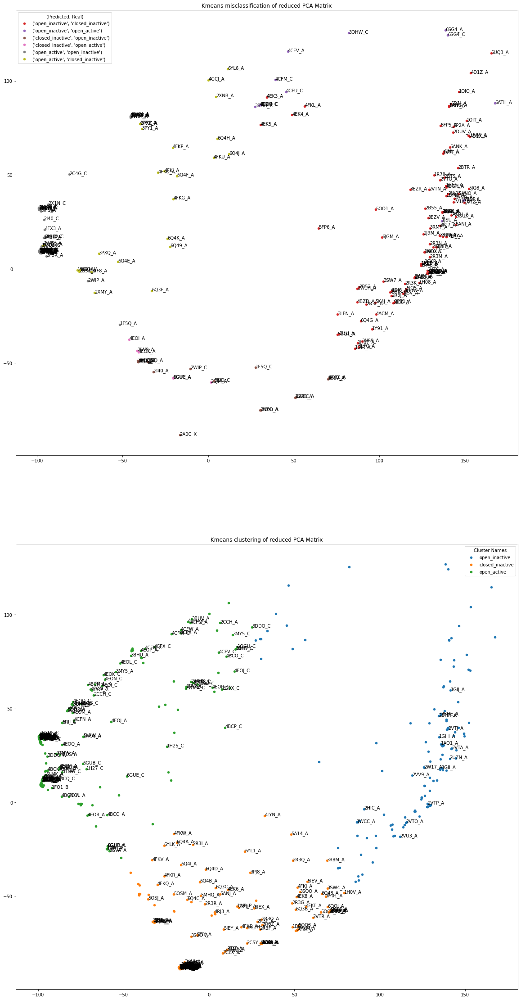

In [ ]:
classes = compute_kmeans(reduced_mat)
cluster_labels, cluster_list= convert_classes_to_clusters(classes)
most_matched = statistics(cluster_list,annotated_dict_list)
misclassified = misclassification(chains_list, cluster_list, annotated_dict_list, most_matched,531) #this way if all are misclassified we'll have the full list
#print(f"misclassified: {misclassified}")
plot_cluster_map(X=reduced_mat,misclassified=misclassified,most_matched =most_matched,chains_list = chains_list,classes = classes,cluster_labels = cluster_labels)

## Hierarchical clustering algorithms using Scipy
These algorithms rely on a distance matrix computed at each iteration.
$d[i,j]$ is distance between cluster _i_ and _j_ in the original forest
We also define clusters _s_, _t_, _u_ formed from _s_ and _t_ which are then removed as _u_ is added to the forest. Finally we introduce cluster _v_ a cluster that is not _u_ unused after the formation of _u_.

### Ward's Algorithm
A linkage with minimum variance method. We define 
$$
T = |v| + |s| + |t|
$$
As the cardinality the forest _u_ and _v_ combined
Given the distance function is computed recursively with the equation:
$$
d[i][j] = d(i,j) = \sqrt{\frac{|v| + |s|}{T}d(v,s)^2 + \frac{|v| + |t|}{T}d(v,t)^2 - \frac{|v|}{T}d(s,t)^2}
$$
The merging cost, of which ward's algorithm tries to minimize the growth is defined as follows:
$$
Cost(u,v) = \frac{|u||v|}{|u| +|v|}||c_u - c_v ||^2
$$
$c_i$ is the vector of the centroid. And the derivation comes from the distance sum union of the two sets together minus the distance sum of the individual sets. 
<br>
It considers the case of merging and then calculates the variance from the centroid of the final merged cluster as the distance


### Ward's algorithm CA alpha RMSD matrix:

/var/folders/rf/gvtptwp96wvd1g29v6rqbgj40000gn/T/ipykernel_2942/3618511358.py:2: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  out_ward = linkage(matrix, 'ward')


cut tree: [[  0   0   0 ...   0   0   0]
 [  1   1   1 ...   1   0   0]
 [  2   2   2 ...   1   0   0]
 ...
 [528 527 526 ...   1   0   0]
 [529 528 527 ...   0   0   0]
 [530 529 528 ...   0   0   0]]


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/scipy/cluster/hierarchy.py:834: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  return linkage(y, method='ward', metric='euclidean')


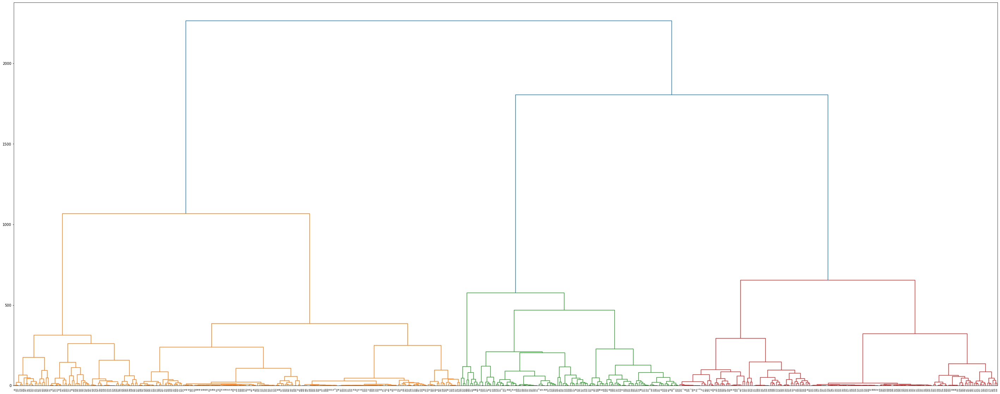

In [6]:
#print(f"len matrix: {len(matrix)}")
out_ward = linkage(matrix, 'ward')
fig = plt.figure(figsize=(50,20))
dn = dendrogram(out_ward)
print(f"cut tree: {cut_tree(out_ward)}")
ward_cluster = AgglomerativeClustering(n_clusters=3).fit(matrix)

#print(f"is_valid_linkage: {is_valid_linkage(out_ward)}")

In [7]:
#
# print(f"ward_cluster: {ward_cluster.labels_}")
cluster_labels, cluster_list = convert_classes_to_clusters(ward_cluster.labels_)
most_matched = statistics(cluster_list,annotated_dict_list)
misclassified = misclassification(chains_list, cluster_list, annotated_dict_list, most_matched,531)
plot_cluster_map(reduced_mat,misclassified,most_matched,chains_list,classes= classes, cluster_labels=cluster_labels, title=title)

------------------------------------------------------------
STATISTICS
------------------------------------------------------------
cluster 0, length: 118
cluster 1, length: 172
cluster 2, length: 241
------------------------------------------------------------
MACRO AVERAGES
------------------------------------------------------------
                 Precision    Recall  F1 score
open_inactive     0.135593  0.173913  0.152381
closed_inactive   0.872093  0.541516  0.668151
open_active       0.626556  0.932099  0.749380
Averages          0.544747  0.549176  0.523304
out:
                            Real open_inactive  Real closed_inactive  Real open_active
Predicted open_inactive                    16                    96                 6
Predicted closed_inactive                  17                   150                 5
Predicted open_active                      59                    31               151
------------------------------------------------------------
MICRO AVERAGES


NameError: name 'reduced_mat' is not defined

In [ ]:
l = leaves_list(out_ward)
#print(f"l: {l}")
tree = to_tree(out_ward)
##############################
#Split the trees into usable groups
yellow_tree = tree.get_left()
green_tree = tree.get_right().get_left()
red_tree = tree.get_right().get_right()
idx1= yellow_tree.count
idx2= idx1+green_tree.count
grouped_list_ward = [np.sort(l[:idx1]),np.sort(l[idx1:idx2]),np.sort(l[idx2:])]
n = tree.count
#print(f"grouped_list: {grouped_list}")
most_matched = statistics(grouped_list_ward,annotated_dict_list)
misclassified = misclassification(chains_list, grouped_list_ward, annotated_dict_list, most_matched,samples =531)
plot_cluster_map(reduced_mat,misclassified,most_matched,chains_list, cluster_list=grouped_list_ward)
#maybe 3x3 matrix to evaluate the misclassification in the two other groups #multiclass precision, accuracy, F-score

------------------------------------------------------------
STATISTICS
------------------------------------------------------------
cluster 0, length: 241
cluster 1, length: 118
cluster 2, length: 172
------------------------------------------------------------
MACRO AVERAGES
------------------------------------------------------------
                 Precision    Recall  F1 score
open_active       0.626556  0.932099  0.749380
open_inactive     0.135593  0.173913  0.152381
closed_inactive   0.872093  0.541516  0.668151
Averages          0.544747  0.549176  0.523304
out:
                            Real open_active  Real open_inactive  Real closed_inactive
Predicted open_active                   151                  59                    31
Predicted open_inactive                   6                  16                    96
Predicted closed_inactive                 5                  17                   150
------------------------------------------------------------
MICRO AVERAGES


### different tree ordering
This time we try with different tree partitioning

------------------------------------------------------------
STATISTICS
------------------------------------------------------------
cluster 0, length: 67
cluster 1, length: 174
cluster 2, length: 290
------------------------------------------------------------
MACRO AVERAGES
------------------------------------------------------------
                 Precision    Recall  F1 score
open_inactive     0.104478  0.076087  0.088050
open_active       0.643678  0.691358  0.666667
closed_inactive   0.848276  0.888087  0.867725
Averages          0.532144  0.551844  0.540814
out:
                            Real open_inactive  Real open_active  Real closed_inactive
Predicted open_inactive                     7                39                    21
Predicted open_active                      52               112                    10
Predicted closed_inactive                  33                11                   246
------------------------------------------------------------
MICRO AVERAGES
-

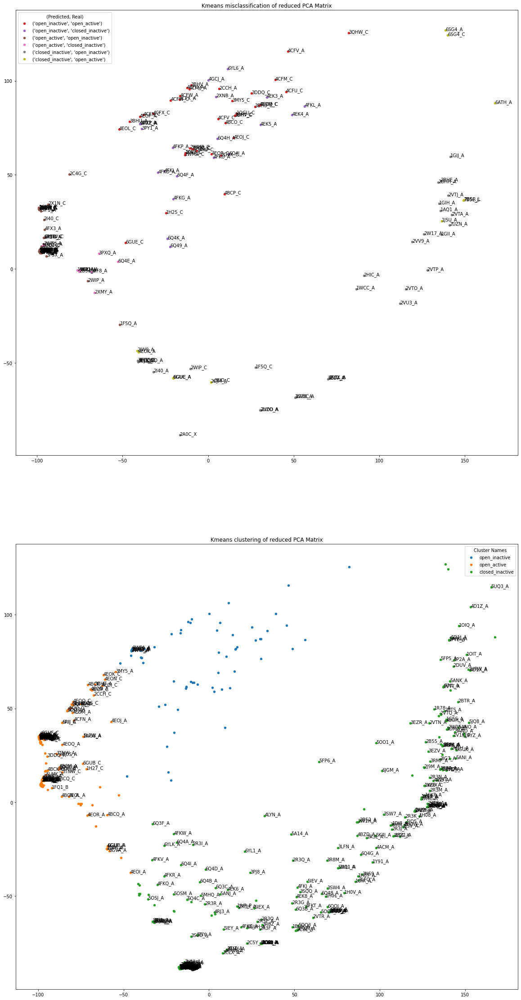

In [ ]:
l = leaves_list(out_ward)
#print(f"l: {l}")
tree = to_tree(out_ward)
##############################
#Split the trees into usable groups
yellow_tree = tree.get_left().get_left()
green_tree = tree.get_left().get_right()
red_tree = tree.get_right()
idx1= yellow_tree.count
idx2= idx1+green_tree.count
grouped_list_ward = [np.sort(l[:idx1]),np.sort(l[idx1:idx2]),np.sort(l[idx2:])]
n = tree.count
#print(f"grouped_list: {grouped_list}")
most_matched = statistics(grouped_list_ward,annotated_dict_list)
misclassified = misclassification(chains_list, grouped_list_ward, annotated_dict_list, most_matched,samples =531)
plot_cluster_map(reduced_mat,misclassified,most_matched,chains_list, cluster_list=grouped_list_ward)

### RMSD Matrix Heat Map

len l: 531 max l: 530 chains list length: 531
starting heat function 2


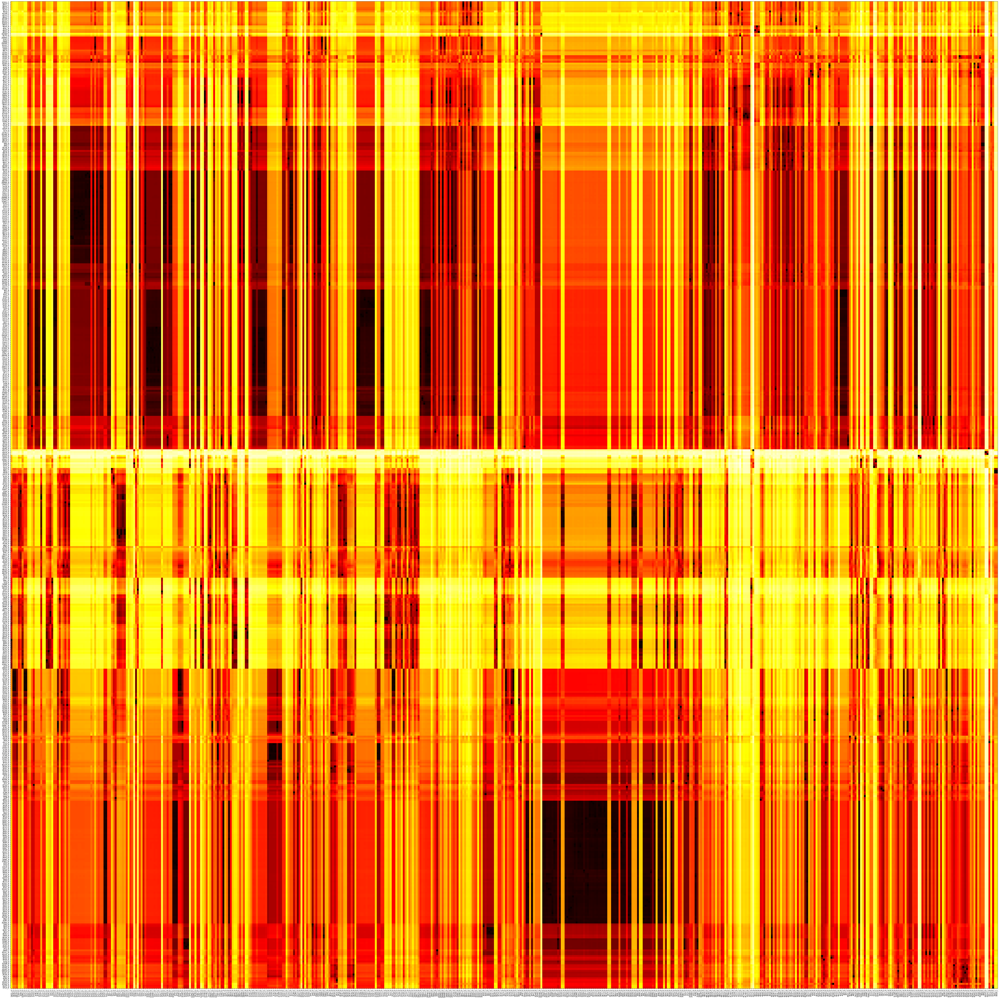

In [ ]:
#print(f"len l: {len(l)} max l: {max(l)} chains list length: {len(chains_list)}")
#heat_map(l,chains_list,matrix)

## PCA of CA and CB RSMD Matrix

shape reduced matrix: (531, 2)
axes[0][0]: 135.76020667301674 matrix.T: [[135.76020667  70.5133525   70.94308717 ... -26.26900724 149.23928136
  149.42811057]
 [ 31.05728639 -58.3650935  -58.21254237 ... -22.97875411  36.4308554
   36.64528995]]


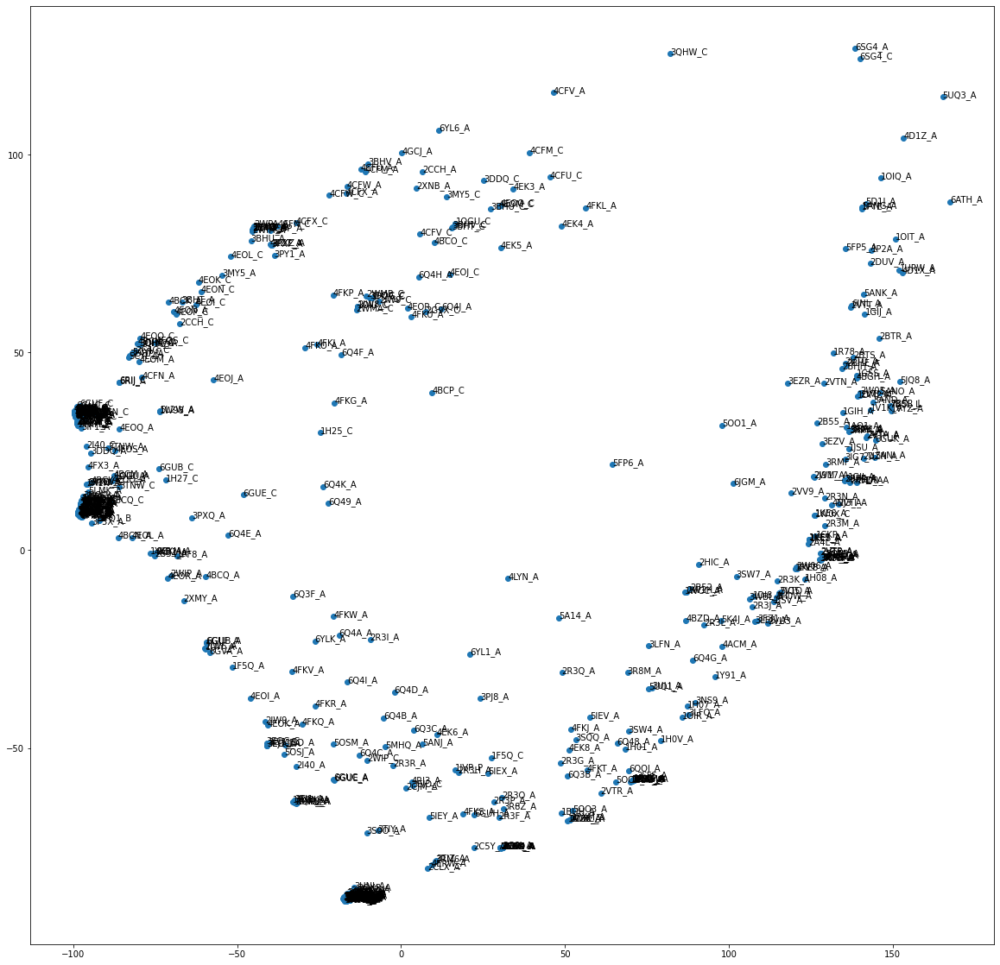

In [ ]:
reduced_mat_AB= plot_pca(matrix,chains_list)

## Real Cluster Map of CA and CB RMSD Matrix

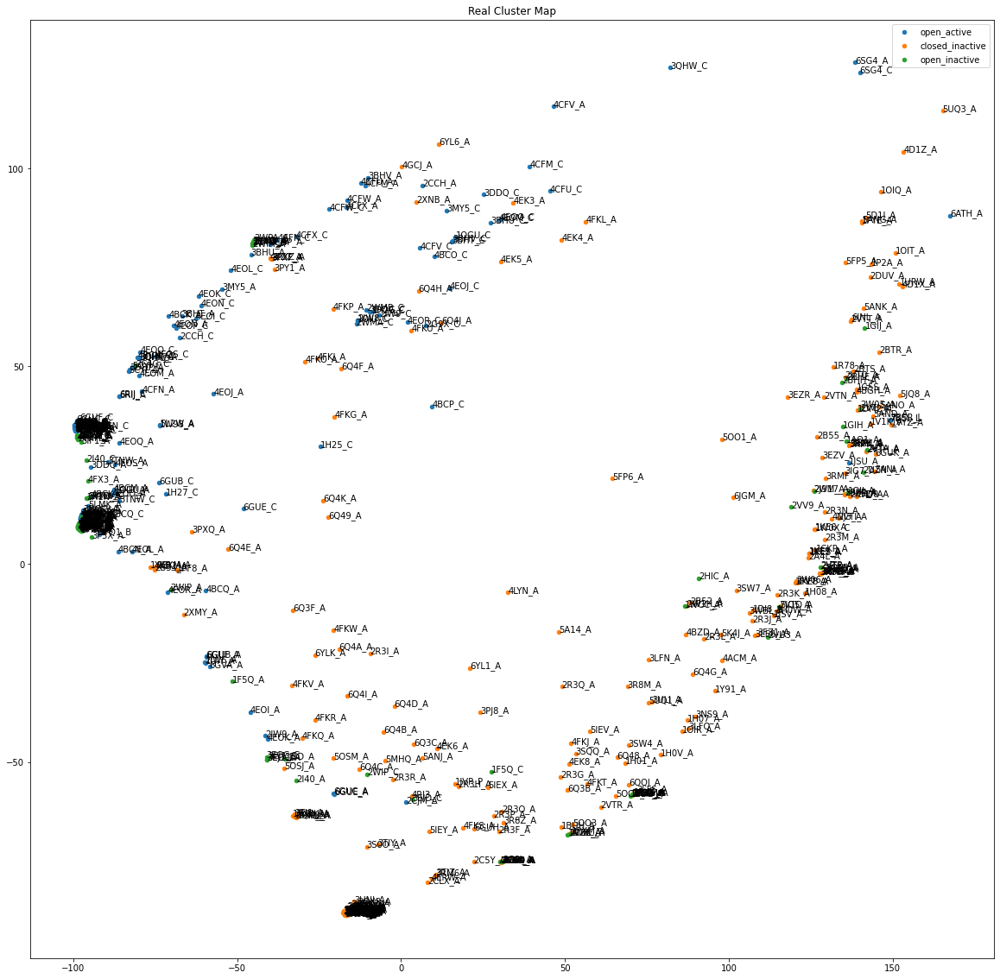

In [ ]:
real_cluster_map(reduced_mat_AB,annotated_dict_list,chains_list)

### Ward's algorithm CA and CB RMSD Matrix

/var/folders/rf/gvtptwp96wvd1g29v6rqbgj40000gn/T/ipykernel_12343/3909946644.py:1: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  out_ward_AB = linkage(matrix_AB, 'ward')


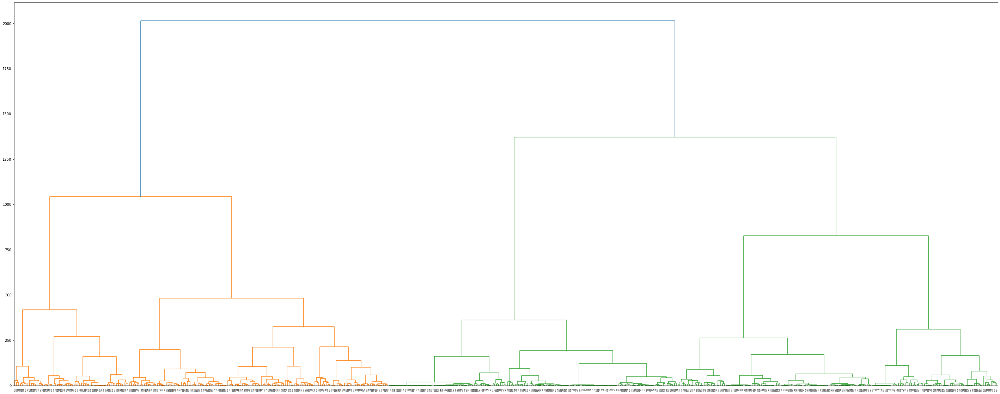

In [ ]:
out_ward_AB = linkage(matrix_AB, 'ward')
fig = plt.figure(figsize=(50,20))
dn = dendrogram(out_ward_AB)

------------------------------------------------------------
STATISTICS
------------------------------------------------------------
cluster 0, length: 202
cluster 1, length: 156
cluster 2, length: 173
------------------------------------------------------------
MACRO AVERAGES
------------------------------------------------------------
                 Precision    Recall  F1 score
open_inactive     0.118812  0.260870  0.163265
open_active       0.551282  0.530864  0.540881
closed_inactive   0.791908  0.494585  0.608889
Averages          0.487334  0.428773  0.437678
out:
                            Real open_inactive  Real open_active  Real closed_inactive
Predicted open_inactive                    24                58                   120
Predicted open_active                      50                86                    20
Predicted closed_inactive                  18                18                   137
------------------------------------------------------------
MICRO AVERAGES


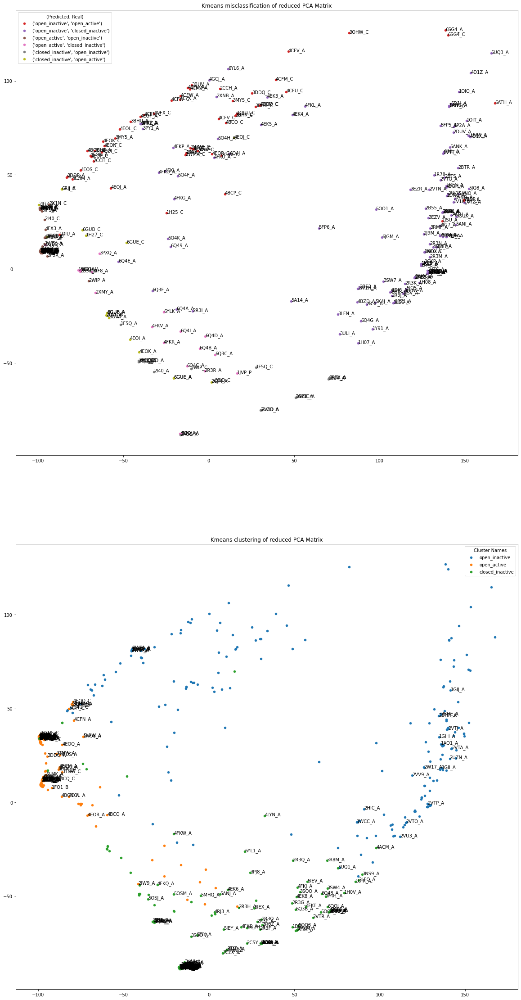

In [ ]:
l = leaves_list(out_ward_AB)
tree = to_tree(out_ward_AB)
##############################
#Split the trees into usable groups
yellow_tree = tree.get_left()
green_tree = tree.get_right().get_left()
red_tree = tree.get_right().get_right()
idx1= yellow_tree.count
idx2= idx1+green_tree.count
grouped_list_ward_AB = [np.sort(l[:idx1]),np.sort(l[idx1:idx2]),np.sort(l[idx2:])]
n = tree.count
#print(f"grouped_list: {grouped_list}")
most_matched = statistics(grouped_list_ward_AB,annotated_dict_list)
misclassified = misclassification(chains_list, grouped_list_ward_AB, annotated_dict_list, most_matched,samples =531)
plot_cluster_map(reduced_mat_AB,misclassified,most_matched,chains_list,cluster_list=grouped_list_ward_AB)

## PCA of Selected Segement RSMD
Segements with the highest variance are chosen by an algorithm and the matrix is composed of the RSMD of these particular segments to identify each conformation. In this case 33 to 44 near the PSTAIRE Helix and 150 to 159 near the activation loop were chosen

shape reduced matrix: (531, 2)


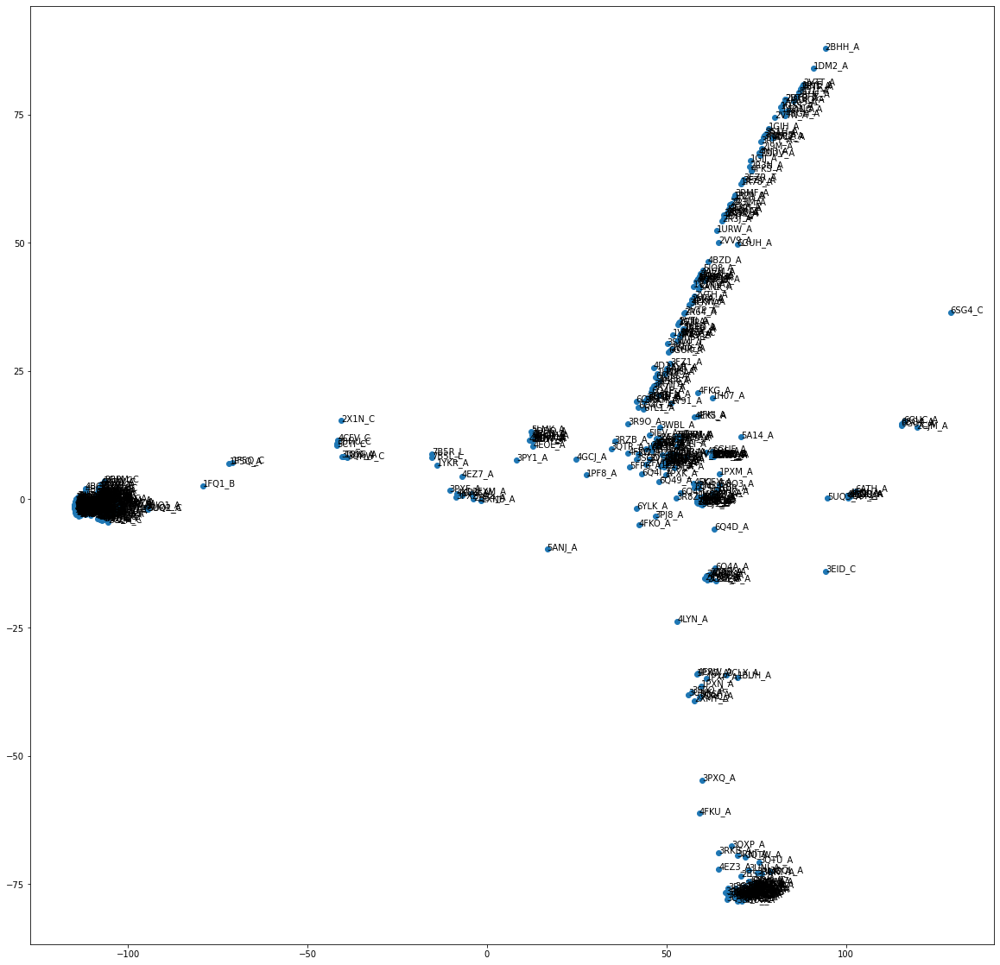

In [28]:
reduced_mat_seg = plot_pca(matrix_seg,chains_list)

### Real cluster RSMD of the selected seg matrix

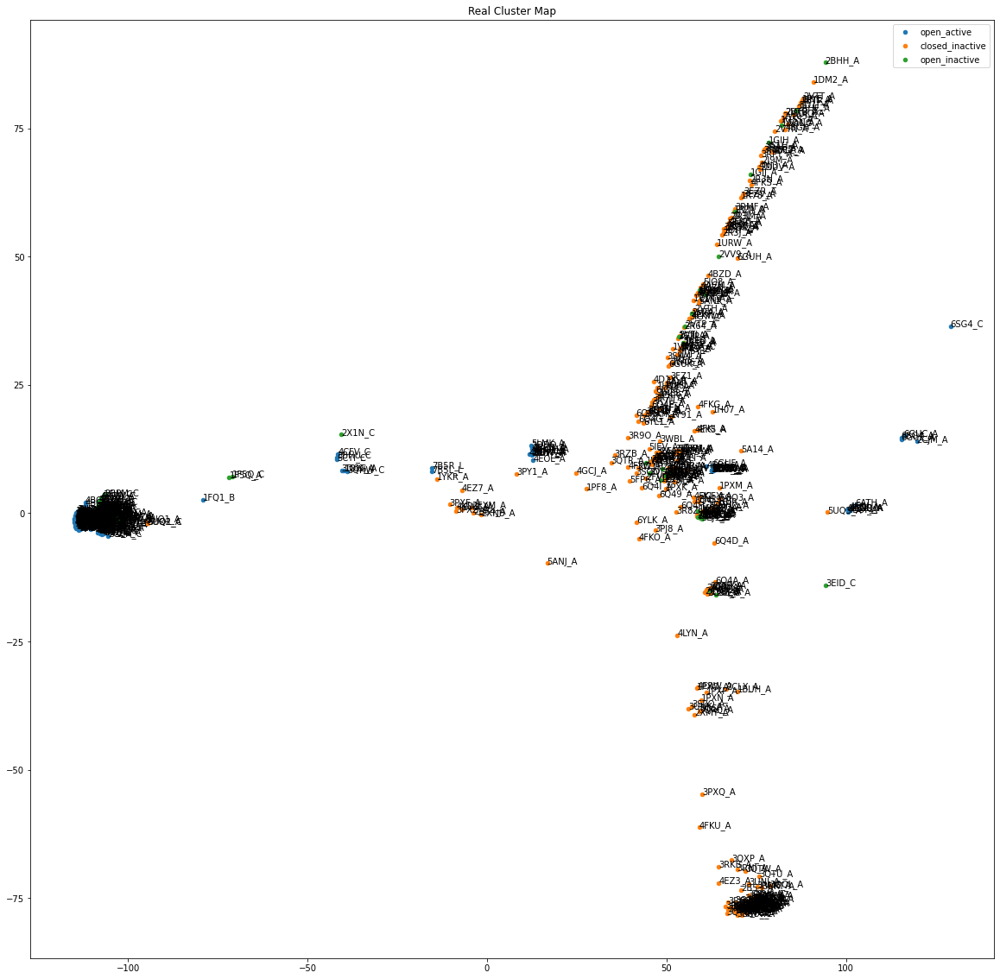

In [ ]:
real_cluster_map(reduced_mat_seg,annotated_dict_list,chains_list)

------------------------------------------------------------
STATISTICS
------------------------------------------------------------
cluster 0, length: 259
cluster 1, length: 83
cluster 2, length: 189
------------------------------------------------------------
MACRO AVERAGES
------------------------------------------------------------
                 Precision    Recall  F1 score
closed_inactive   0.741313  0.693141  0.716418
open_inactive     0.012048  0.010870  0.011429
open_active       0.661376  0.771605  0.712251
Averages          0.471579  0.491872  0.480032
out:
                            Real closed_inactive  Real open_inactive  Real open_active
Predicted closed_inactive                   192                  30                37
Predicted open_inactive                      82                   1                 0
Predicted open_active                         3                  61               125
------------------------------------------------------------
MICRO AVERAGES
-

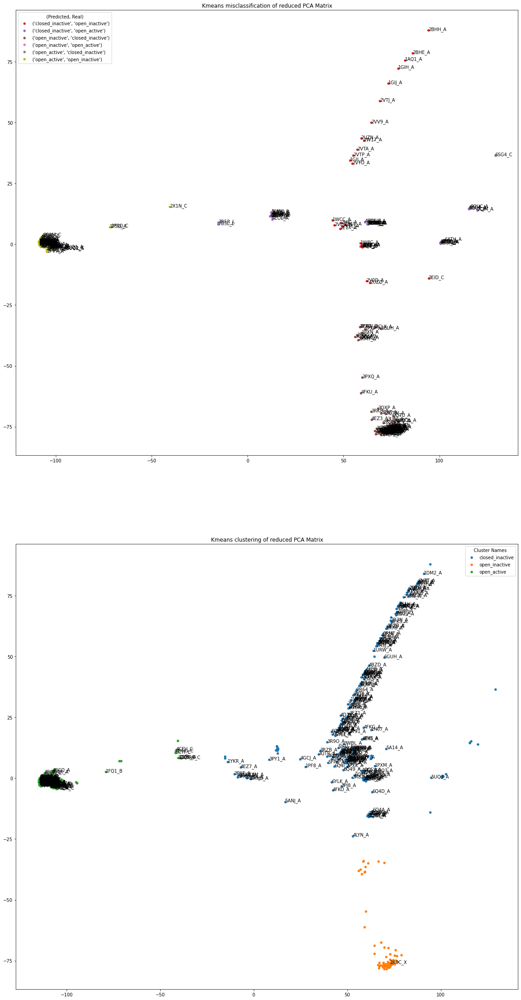

In [ ]:
classes = compute_kmeans(reduced_mat_seg)
cluster_labels, cluster_list= convert_classes_to_clusters(classes)
most_matched = statistics(cluster_list,annotated_dict_list)
misclassified = misclassification(chains_list, cluster_list, annotated_dict_list, most_matched,531) #this way if all are misclassified we'll have the full list
#print(f"misclassified: {misclassified}")
plot_cluster_map(X=reduced_mat_seg,misclassified=misclassified,most_matched =most_matched,chains_list = chains_list,classes = classes,cluster_labels = cluster_labels)

### Performing ward's algorithm on the classification

/var/folders/rf/gvtptwp96wvd1g29v6rqbgj40000gn/T/ipykernel_1613/3640229977.py:1: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  out_ward_seg = linkage(matrix_seg, 'ward')


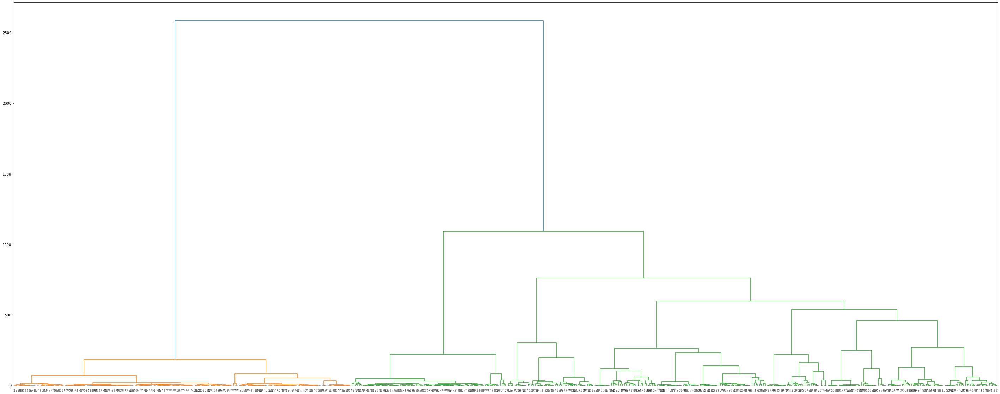

In [25]:
out_ward_seg = linkage(matrix_seg, 'ward')
fig = plt.figure(figsize=(50,20))
dn = dendrogram(out_ward_seg)

### Intuitive Tree Paritioning
Making 3 clusters with the last three grouped together branches

In [31]:
l = leaves_list(out_ward_seg)
tree = to_tree(out_ward_seg)
##############################
#Split the trees into usable groups
yellow_tree = tree.get_left()
green_tree = tree.get_right().get_left()
red_tree = tree.get_right().get_right()
idx1= yellow_tree.count
idx2= idx1+green_tree.count
print(f"idx1: {idx1}, idx2: {idx2}")
grouped_list_ward_seg = [np.sort(l[:idx1]),np.sort(l[idx1:idx2]),np.sort(l[idx2:])]
n = tree.count
#print(f"grouped_list: {grouped_list}")
most_matched = statistics(grouped_list_ward_seg,annotated_dict_list)

idx1: 182, idx2: 266
------------------------------------------------------------
STATISTICS
------------------------------------------------------------
cluster 0, length: 182
cluster 1, length: 84
cluster 2, length: 265
------------------------------------------------------------
MACRO AVERAGES
------------------------------------------------------------
                 Precision    Recall  F1 score
open_active       0.653846  0.734568  0.691860
open_inactive     0.011905  0.010870  0.011364
closed_inactive   0.720755  0.689531  0.704797
Averages          0.462169  0.478323  0.469340
out:
                            Real open_active  Real open_inactive  Real closed_inactive
Predicted open_active                   119                  60                     3
Predicted open_inactive                   0                   1                    83
Predicted closed_inactive                43                  31                   191
--------------------------------------------------------

misclassified = misclassification(chains_list, grouped_list_ward_seg, annotated_dict_list, most_matched,samples =531)
plot_cluster_map(reduced_mat_seg,misclassified,most_matched,chains_list,cluster_list=grouped_list_ward_seg)

### Ward's algorithm of segments RMSD with different partitioning
Now we try a deeper not less obvious partitioning

idx1: 118, idx2: 182
------------------------------------------------------------
STATISTICS
------------------------------------------------------------
cluster 0, length: 118
cluster 1, length: 64
cluster 2, length: 349
------------------------------------------------------------
MACRO AVERAGES
------------------------------------------------------------
                 Precision    Recall  F1 score
open_active       1.000000  0.728395  0.842857
open_inactive     0.937500  0.652174  0.769231
closed_inactive   0.785100  0.989170  0.875399
Averages          0.907533  0.789913  0.829162
out:
                            Real open_active  Real open_inactive  Real closed_inactive
Predicted open_active                   118                   0                     0
Predicted open_inactive                   1                  60                     3
Predicted closed_inactive                43                  32                   274
--------------------------------------------------------

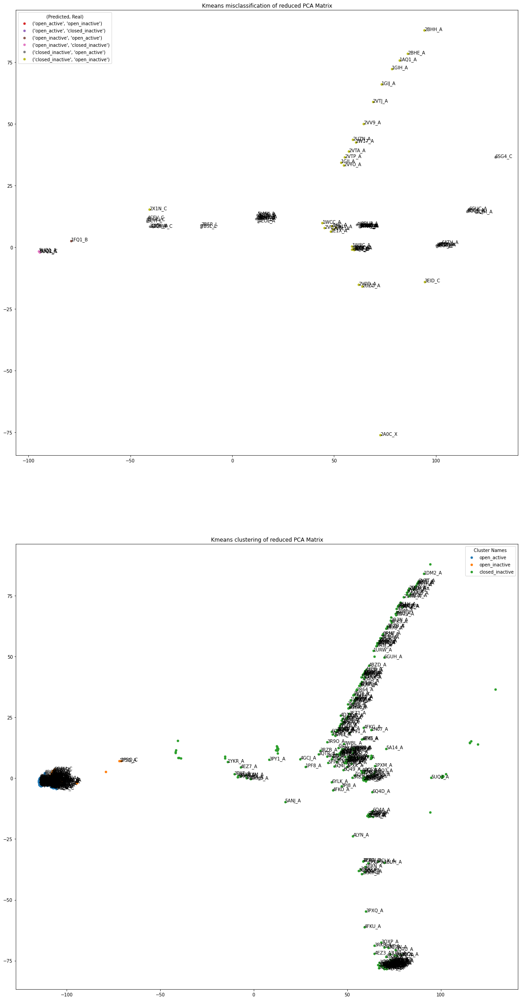

In [32]:
l = leaves_list(out_ward_seg)
tree = to_tree(out_ward_seg)
##############################
#Split the trees into usable groups
yellow_tree = tree.get_left().get_left()
green_tree = tree.get_left().get_right()
red_tree = tree.get_right()
idx1= yellow_tree.count
idx2= idx1+green_tree.count
print(f"idx1: {idx1}, idx2: {idx2}")
grouped_list_ward_seg = [np.sort(l[:idx1]),np.sort(l[idx1:idx2]),np.sort(l[idx2:])]
n = tree.count
#print(f"grouped_list: {grouped_list}")
most_matched = statistics(grouped_list_ward_seg,annotated_dict_list)
misclassified = misclassification(chains_list, grouped_list_ward_seg, annotated_dict_list, most_matched,samples =531)
plot_cluster_map(reduced_mat_seg,misclassified,most_matched,chains_list,cluster_list=grouped_list_ward_seg)

## Average Linkage: CA

/var/folders/rf/gvtptwp96wvd1g29v6rqbgj40000gn/T/ipykernel_12343/3184923608.py:1: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  out_average = linkage(matrix, 'average')


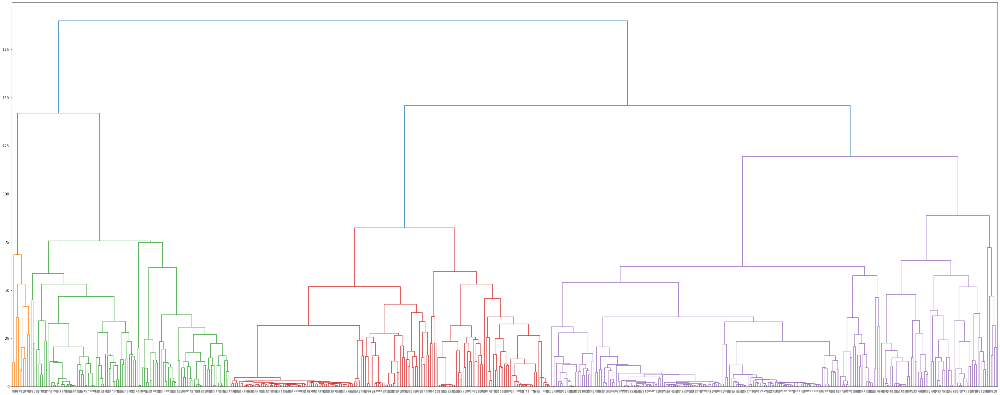

In [ ]:
out_average = linkage(matrix, 'average')
fig = plt.figure(figsize=(50,20))
dn = dendrogram(out_average)

In [ ]:
l = leaves_list(out_average)
tree = to_tree(out_average)
##############################
#Split the trees into usable groups
tree1 = tree.get_left()
tree2 = tree.get_right().get_left()
tree3 = tree.get_right().get_right()
idx1= tree1.count
idx2= idx1+tree2.count
grouped_list_average = [np.sort(l[:idx1]),np.sort(l[idx1:idx2]),np.sort(l[idx2:])]
n = tree.count
#print(f"grouped_list: {grouped_list}")
statistics(grouped_list_average,annotated_dict_list)


------------------------------------------------------------
STATISTICS
------------------------------------------------------------
cluster 0, length: 118
cluster 1, length: 172
cluster 2, length: 241
------------------------------------------------------------
MACRO AVERAGES
------------------------------------------------------------
                 Precision    Recall  F1 score
open_inactive     0.135593  0.173913  0.152381
closed_inactive   0.872093  0.541516  0.668151
open_active       0.626556  0.932099  0.749380
Averages          0.544747  0.549176  0.523304
out:
                            Real open_inactive  Real closed_inactive  Real open_active
Predicted open_inactive                    16                    96                 6
Predicted closed_inactive                  17                   150                 5
Predicted open_active                      59                    31               151
------------------------------------------------------------
MICRO AVERAGES


(['open_inactive', 'closed_inactive', 'open_active'], 317)

### Average Linkage CA + CB

/var/folders/rf/gvtptwp96wvd1g29v6rqbgj40000gn/T/ipykernel_12343/2534781170.py:1: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  out_average_AB = linkage(matrix_AB, 'average')


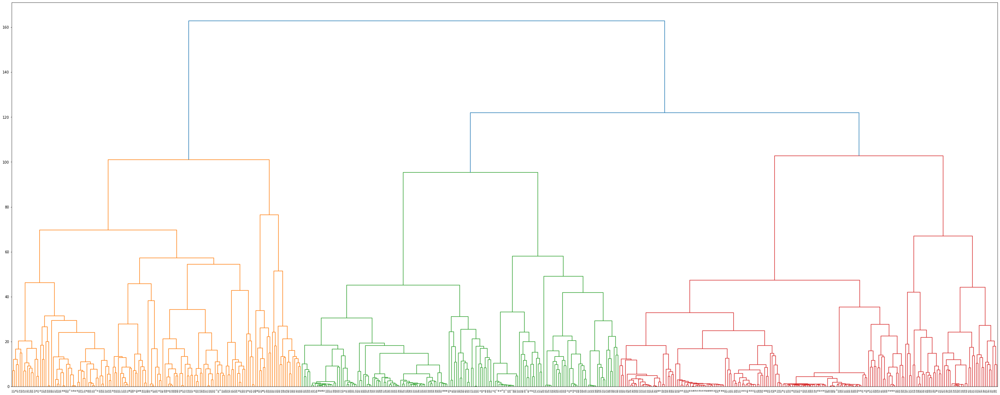

In [ ]:
out_average_AB = linkage(matrix_AB, 'average')
fig = plt.figure(figsize=(50,20))
dn = dendrogram(out_average_AB)

In [ ]:
l = leaves_list(out_average_AB)
tree = to_tree(out_average_AB)
##############################
#Split the trees into usable groups
tree1 = tree.get_left()
tree2 = tree.get_right().get_left()
tree3 = tree.get_right().get_right()
idx1= tree1.count
idx2= idx1+tree2.count
grouped_list_average = [np.sort(l[:idx1]),np.sort(l[idx1:idx2]),np.sort(l[idx2:])]
n = tree.count
#print(f"grouped_list: {grouped_list}")
statistics(grouped_list_average,annotated_dict_list)

------------------------------------------------------------
STATISTICS
------------------------------------------------------------
cluster 0, length: 156
cluster 1, length: 171
cluster 2, length: 204
------------------------------------------------------------
MACRO AVERAGES
------------------------------------------------------------
                 Precision    Recall  F1 score
open_inactive     0.102564  0.173913  0.129032
closed_inactive   0.789474  0.487365  0.602679
open_active       0.549020  0.691358  0.612022
Averages          0.480352  0.450879  0.447911
out:
                            Real open_inactive  Real closed_inactive  Real open_active
Predicted open_inactive                    16                   108                32
Predicted closed_inactive                  18                   135                18
Predicted open_active                      58                    34               112
------------------------------------------------------------
MICRO AVERAGES


(['open_inactive', 'closed_inactive', 'open_active'], 263)

## Centroid CA

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/scipy/cluster/hierarchy.py:633: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  return linkage(y, method='centroid', metric='euclidean')


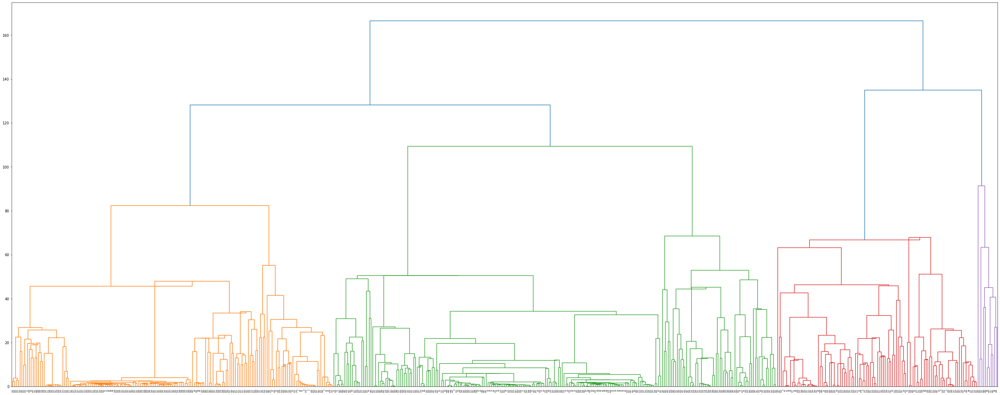

In [ ]:
out_centroid = centroid(matrix)
fig = plt.figure(figsize=(50,20))
dn = dendrogram(out_centroid)

In [ ]:
l = leaves_list(out_centroid)
tree = to_tree(out_centroid)
##############################
#Split the trees into usable groups
yellow_tree = tree.get_left().get_left()
green_tree = tree.get_left().get_right()
red_tree = tree.get_right()
idx1= yellow_tree.count
idx2= idx1+green_tree.count
grouped_list_centroid = [np.sort(l[:idx1]),np.sort(l[idx1:idx2]),np.sort(l[idx2:])]
n = tree.count
#print(f"grouped_list: {grouped_list}")
statistics(grouped_list_centroid,annotated_dict_list)

------------------------------------------------------------
STATISTICS
------------------------------------------------------------
cluster 0, length: 173
cluster 1, length: 239
cluster 2, length: 119
------------------------------------------------------------
MACRO AVERAGES
------------------------------------------------------------
                 Precision    Recall  F1 score
closed_inactive   0.867052  0.541516  0.666667
open_active       0.623431  0.919753  0.743142
open_inactive     0.134454  0.173913  0.151659
Averages          0.541646  0.545061  0.520489
out:
                            Real closed_inactive  Real open_active  Real open_inactive
Predicted closed_inactive                   150                 6                  17
Predicted open_active                        31               149                  59
Predicted open_inactive                      96                 7                  16
------------------------------------------------------------
MICRO AVERAGES


(['closed_inactive', 'open_active', 'open_inactive'], 315)

Centroid is less accurate than ward.

### Centroid CA + CB

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/scipy/cluster/hierarchy.py:633: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  return linkage(y, method='centroid', metric='euclidean')


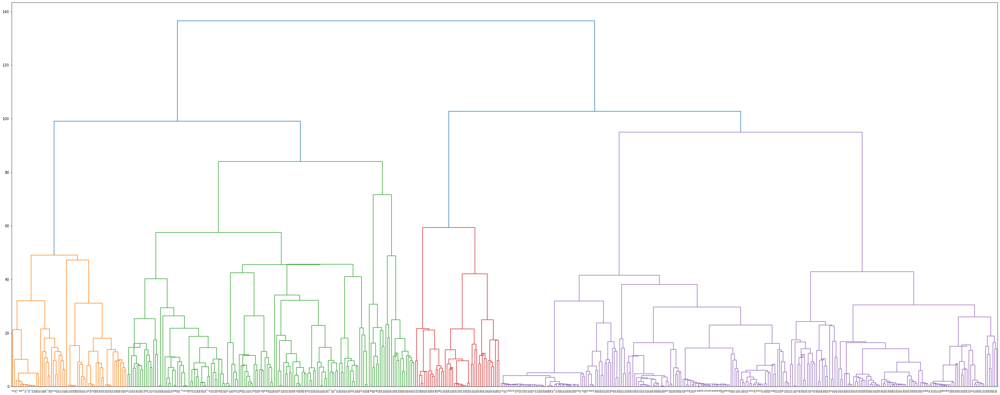

In [ ]:
out_centroid_AB = centroid(matrix_AB)
fig = plt.figure(figsize=(50,20))
dn = dendrogram(out_centroid_AB)

In [ ]:
l = leaves_list(out_centroid_AB)
tree = to_tree(out_centroid_AB)
##############################
#Split the trees into usable groups
yellow_tree = tree.get_left().get_left()
green_tree = tree.get_left().get_right()
red_tree = tree.get_right()
idx1= yellow_tree.count
idx2= idx1+green_tree.count
grouped_list_centroid = [np.sort(l[:idx1]),np.sort(l[idx1:idx2]),np.sort(l[idx2:])]
n = tree.count
#print(f"grouped_list: {grouped_list}")
statistics(grouped_list_centroid,annotated_dict_list)

------------------------------------------------------------
STATISTICS
------------------------------------------------------------
cluster 0, length: 62
cluster 1, length: 155
cluster 2, length: 314
------------------------------------------------------------
MACRO AVERAGES
------------------------------------------------------------
                 Precision    Recall  F1 score
open_inactive     0.145161  0.097826  0.116883
closed_inactive   0.690323  0.386282  0.495370
open_active       0.404459  0.783951  0.533613
Averages          0.413314  0.422686  0.381956
out:
                            Real open_inactive  Real closed_inactive  Real open_active
Predicted open_inactive                     9                    50                 3
Predicted closed_inactive                  16                   107                32
Predicted open_active                      67                   120               127
------------------------------------------------------------
MICRO AVERAGES
-

(['open_inactive', 'closed_inactive', 'open_active'], 243)

## Kernel PCA representation of RSMD Data

shape reduced matrix: (531, 2)


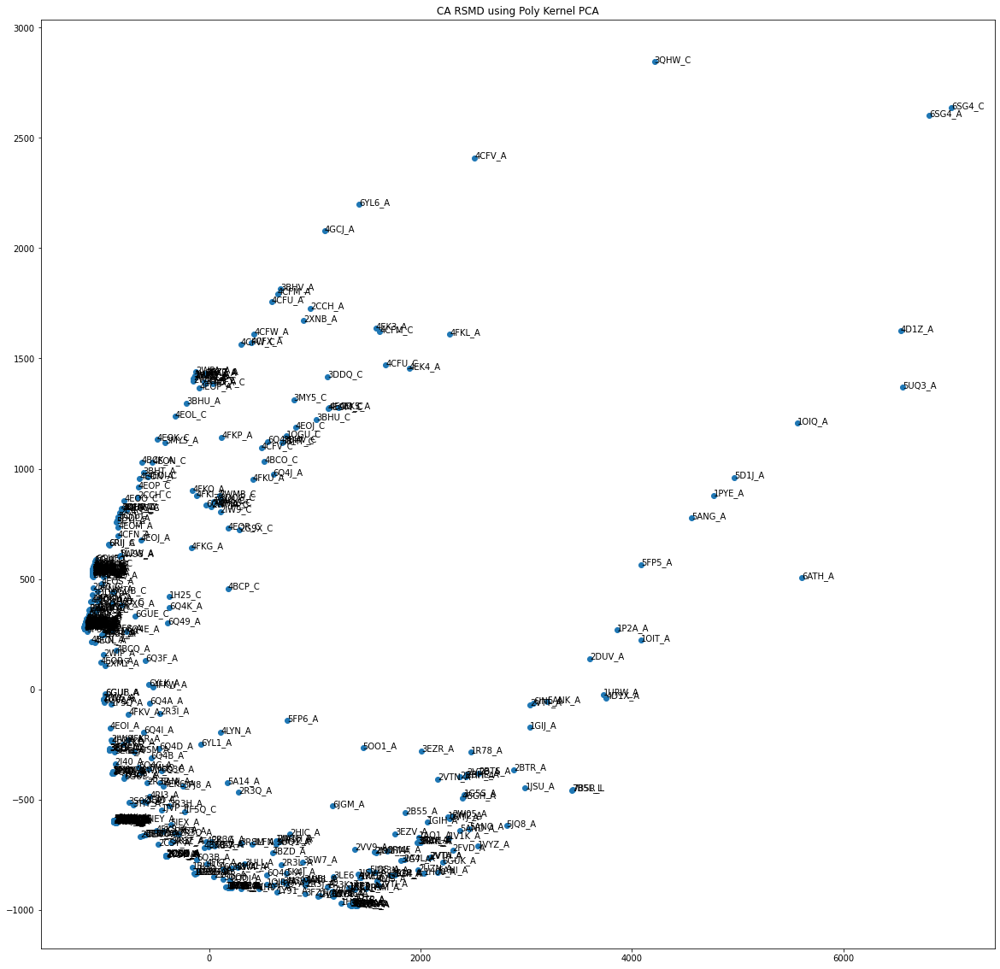

In [12]:
reduced_mat_poly= plot_kpca(matrix,chains_list, kernel="poly",title="CA RSMD using Poly Kernel PCA")

group: open_active
group: closed_inactive
group: open_inactive


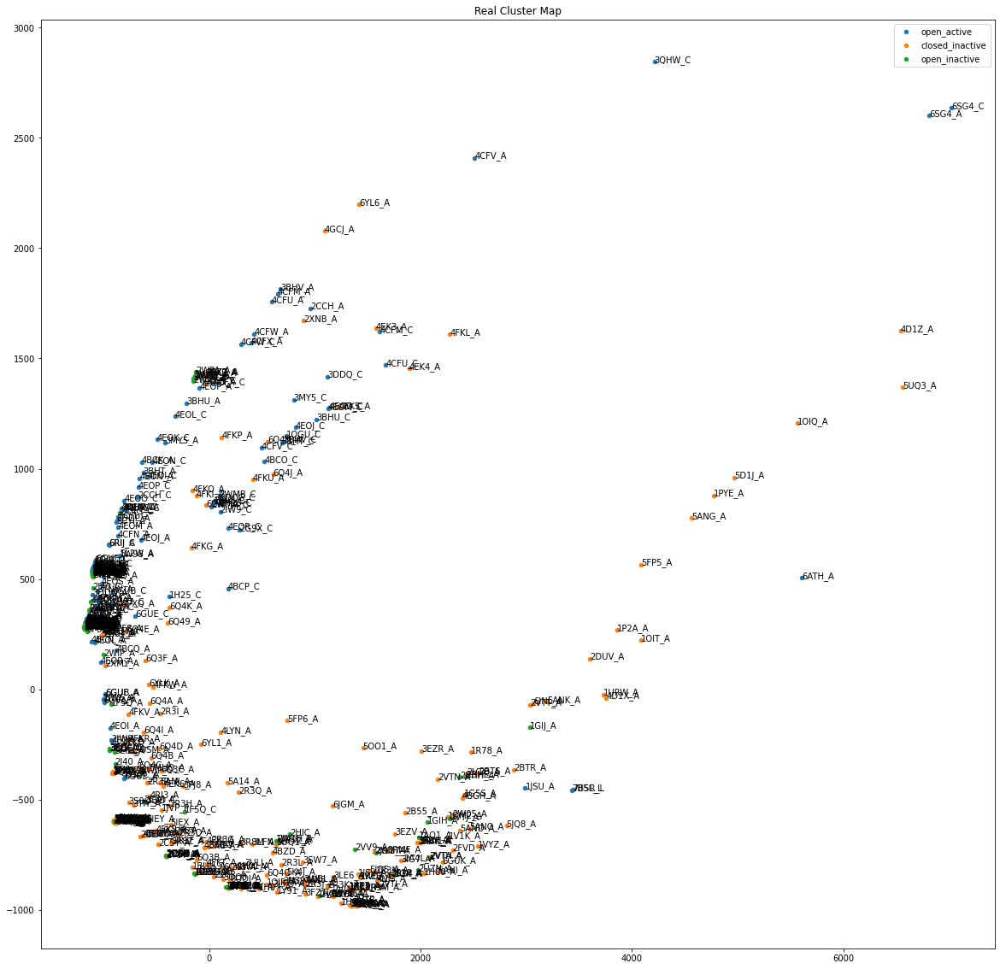

In [15]:
real_cluster_map(reduced_mat_poly,annotated_dict_list, chains_list)

### Kmeans on polynomial kernel

------------------------------------------------------------
STATISTICS
------------------------------------------------------------
cluster 0, length: 130
cluster 1, length: 377
cluster 2, length: 24
------------------------------------------------------------
MACRO AVERAGES
------------------------------------------------------------
                 Precision    Recall  F1 score
closed_inactive   0.800000  0.375451  0.511057
open_active       0.389920  0.907407  0.545455
open_inactive     0.041667  0.010870  0.017241
Averages          0.410529  0.431243  0.357917
out:
                            Real closed_inactive  Real open_active  Real open_inactive
Predicted closed_inactive                   104                 8                  18
Predicted open_active                       157               147                  73
Predicted open_inactive                      16                 7                   1
------------------------------------------------------------
MICRO AVERAGES
-

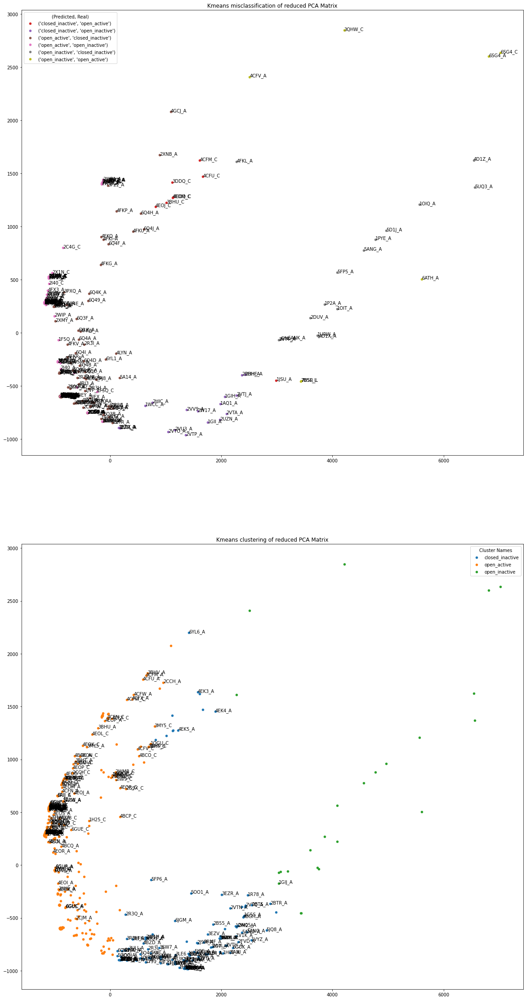

In [22]:
classes = compute_kmeans(reduced_mat_poly)
cluster_labels, cluster_list= convert_classes_to_clusters(classes)
#print(f"cluster_list: {cluster_list}, cluster_labels: {cluster_labels}")
most_matched = statistics(cluster_list,annotated_dict_list)
misclassified = misclassification(chains_list, cluster_list, annotated_dict_list, most_matched,531)
plot_cluster_map(reduced_mat_poly,misclassified,most_matched,chains_list,classes= classes, cluster_labels=cluster_labels)

### Ward's algorithm of the original CA RSMD matrix represented on the polynomial kernel PCA Using good partitioning

------------------------------------------------------------
STATISTICS
------------------------------------------------------------
cluster 0, length: 118
cluster 1, length: 64
cluster 2, length: 349
------------------------------------------------------------
MACRO AVERAGES
------------------------------------------------------------
                 Precision    Recall  F1 score
open_active       1.000000  0.728395  0.842857
open_inactive     0.937500  0.652174  0.769231
closed_inactive   0.785100  0.989170  0.875399
Averages          0.907533  0.789913  0.829162
out:
                            Real open_active  Real open_inactive  Real closed_inactive
Predicted open_active                   118                   0                     0
Predicted open_inactive                   1                  60                     3
Predicted closed_inactive                43                  32                   274
------------------------------------------------------------
MICRO AVERAGES
-

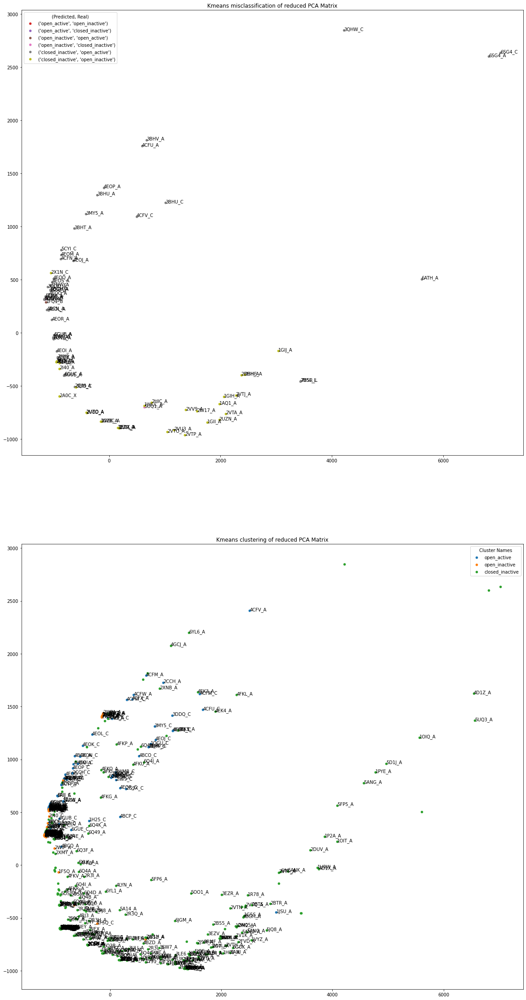

In [33]:
most_matched = statistics(grouped_list_ward_seg,annotated_dict_list)
misclassified = misclassification(chains_list, grouped_list_ward_seg, annotated_dict_list, most_matched,samples =531)
plot_cluster_map(reduced_mat_poly,misclassified,most_matched,chains_list,cluster_list=grouped_list_ward_seg)

shape reduced matrix: (531, 2)
group: open_active
group: closed_inactive
group: open_inactive
------------------------------------------------------------
STATISTICS
------------------------------------------------------------
cluster 0, length: 282
cluster 1, length: 179
cluster 2, length: 70
------------------------------------------------------------
MACRO AVERAGES
------------------------------------------------------------
                 Precision    Recall  F1 score
closed_inactive   0.726950  0.740072  0.733453
open_active       0.659218  0.728395  0.692082
open_inactive     0.014286  0.010870  0.012346
Averages          0.466818  0.493112  0.479293
out:
                            Real closed_inactive  Real open_active  Real open_inactive
Predicted closed_inactive                   205                44                  33
Predicted open_active                         3               118                  58
Predicted open_inactive                      69                 0    

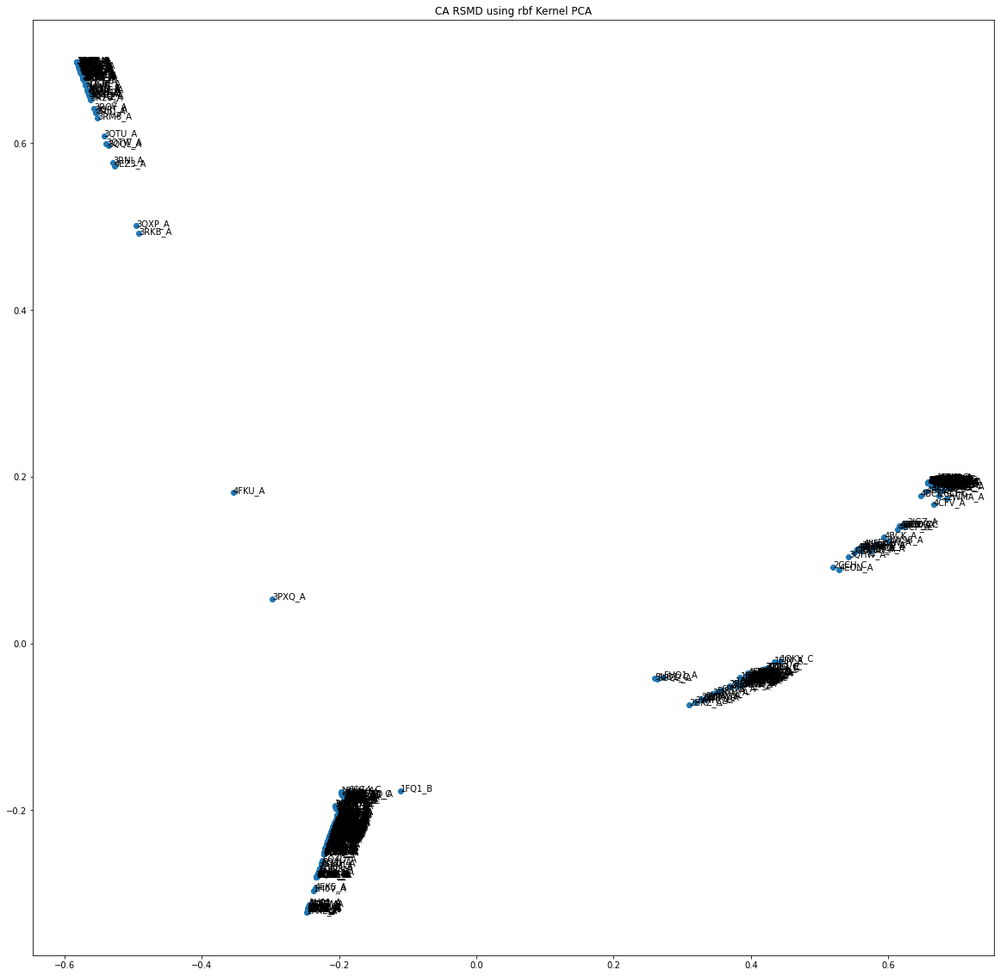

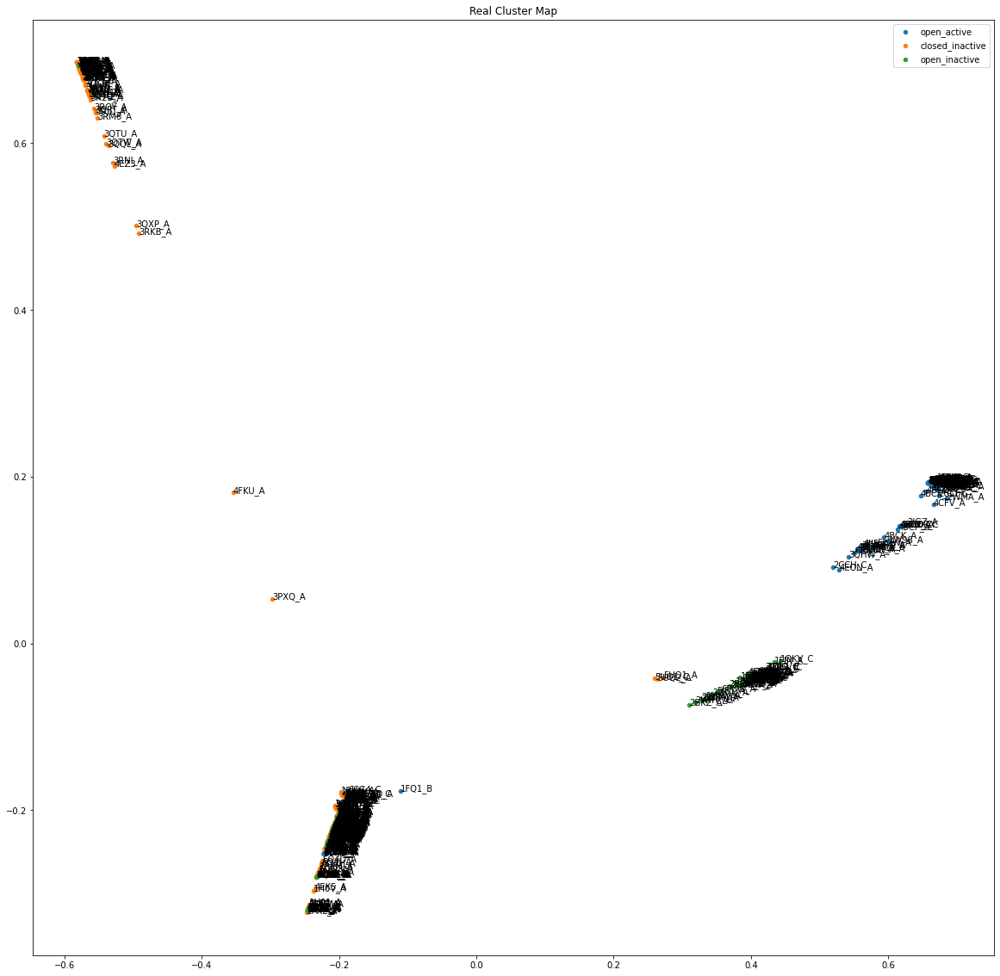

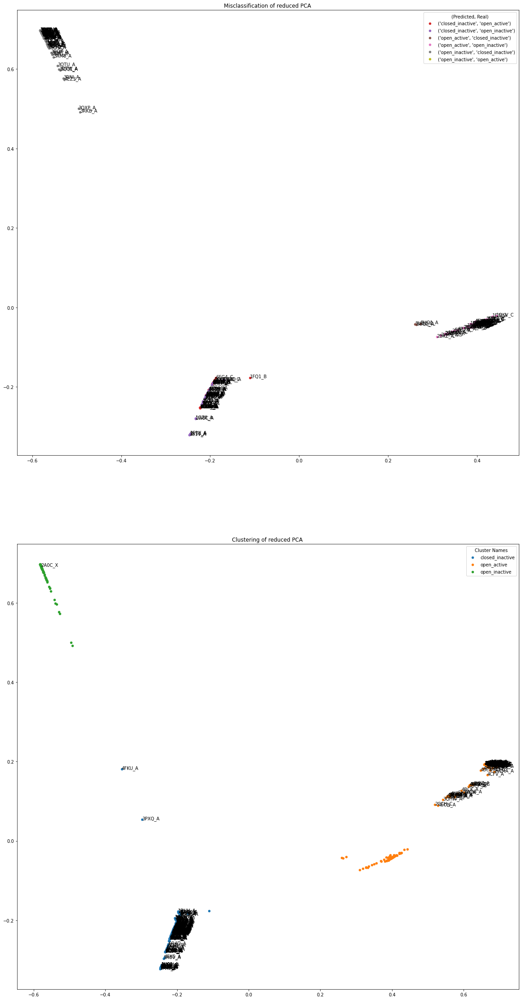

In [8]:
reduced_mat_poly= plot_kpca(matrix_seg,chains_list, kernel="rbf",title="CA RSMD using rbf Kernel PCA")
real_cluster_map(reduced_mat_poly,annotated_dict_list, chains_list)
classes = compute_kmeans(reduced_mat_poly)
cluster_labels, cluster_list= convert_classes_to_clusters(classes)
#print(f"cluster_list: {cluster_list}, cluster_labels: {cluster_labels}")
most_matched = statistics(cluster_list,annotated_dict_list)
misclassified = misclassification(chains_list, cluster_list, annotated_dict_list, most_matched,531)
plot_cluster_map(reduced_mat_poly,misclassified,most_matched,chains_list,classes= classes, cluster_labels=cluster_labels)

## TSNE plot of original CA 